<a href="https://colab.research.google.com/github/Claptar/diploma/blob/main/DE/human_young_vs_old_scanpy/L6_young_vs_old.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies and files

## Install dependencies

In [ ]:
!pip install scanpy[leiden] anndata2ri scikit-misc scvi-tools squidpy gseapy==0.10.8 --quiet

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

## Imports

In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import gseapy
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

Нужно подключить свой гугл диск

In [2]:
dir_path = 'drive/MyDrive/Spatial project/results/'

In [3]:
os.listdir('drive/MyDrive/Spatial project/results/filtered_samples/')

['human.h5ad', 'chimp.h5ad', 'macaque.h5ad', 'spatial_libd_human.h5ad']

In [4]:
# read young human adata object
human_young = sc.read_h5ad(dir_path + 'filtered_samples/human.h5ad')
print(human_young)

# add _young sufix to layer name
human_young.obs.label.replace({"L6a": "L6", "L6b": "L6"}, inplace=True)
human_young.obs.label = human_young.obs.label.astype('str') + '_young'

AnnData object with n_obs × n_vars = 15417 × 19966
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:
# read young human adata object
human_old = sc.read_h5ad(dir_path + 'filtered_samples/spatial_libd_human.h5ad')
print(human_old)

# add _young sufix to layer name
human_old.obs.label = human_old.obs.label.astype('str') + '_old'

AnnData object with n_obs × n_vars = 42588 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_mt_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [6]:
# concat old and young files
adata = an.concat([human_young, human_old], merge='same',uns_merge="unique")
adata.obs_names_make_unique()
adata

/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 58005 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors'
    obsm: 'spatial'

In [7]:
samples = list(adata.uns['spatial'].keys())
samples

['human_759',
 'human_j12',
 'human_j3',
 'human_j4',
 'human_j6',
 '151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676']

In [8]:
del human_old, human_young

# Посмотрим на картинки

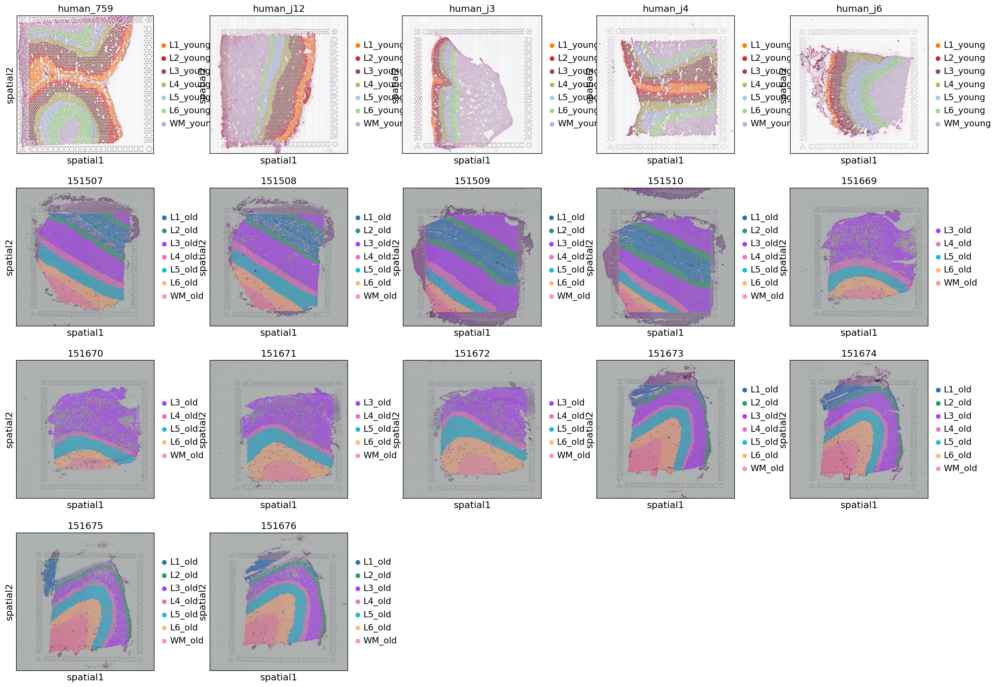

In [9]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', size=1.1, ncols=5, title=samples)

# Differential expression

In [10]:
key = 'DE_L6'
groups = ["L6_young", "L6_old"]

In [11]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:01)


In [12]:
de_adata = adata[adata.obs.label.isin(groups)]
de_adata

View of AnnData object with n_obs × n_vars = 7737 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors', 'label_colors', 'log1p'
    obsm: 'spatial'

## Feature selection

In [13]:
sc.pp.highly_variable_genes(
    adata=de_adata, flavor="seurat", 
    n_top_genes=3000, inplace=True,
    batch_key="sample_id")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:07)


/usr/local/lib/python3.9/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [14]:
highly_variable_genes = de_adata.var[de_adata.var.highly_variable].index.tolist()

## PCA

In [15]:
sc.tl.pca(de_adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


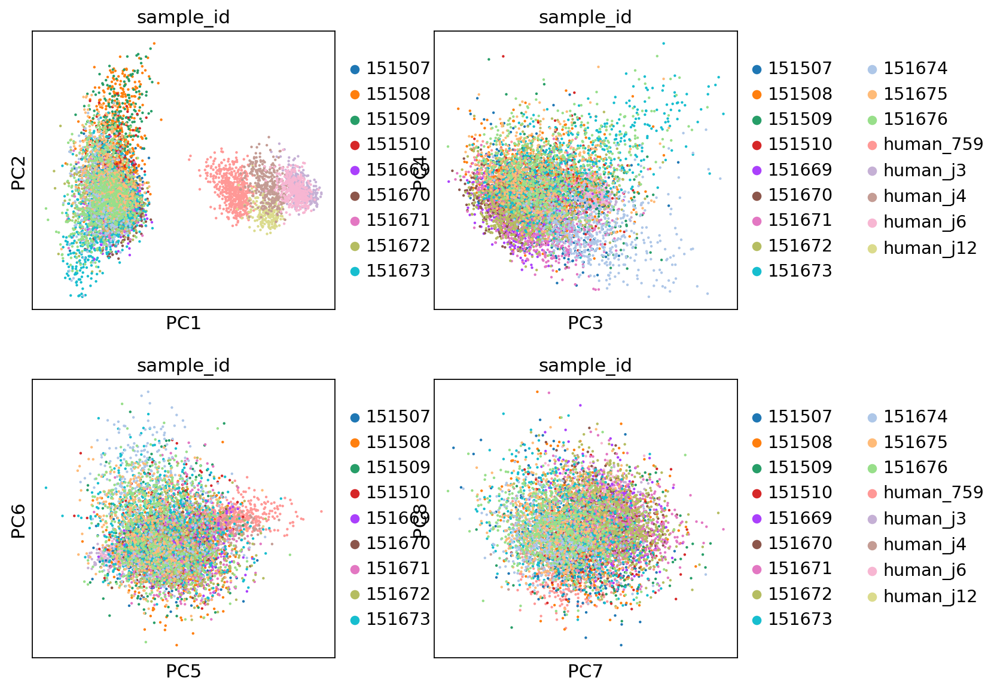

In [16]:
sc.pl.pca(de_adata, color=['sample_id'], components = ['1,2','3,4','5,6','7,8'], ncols=2)

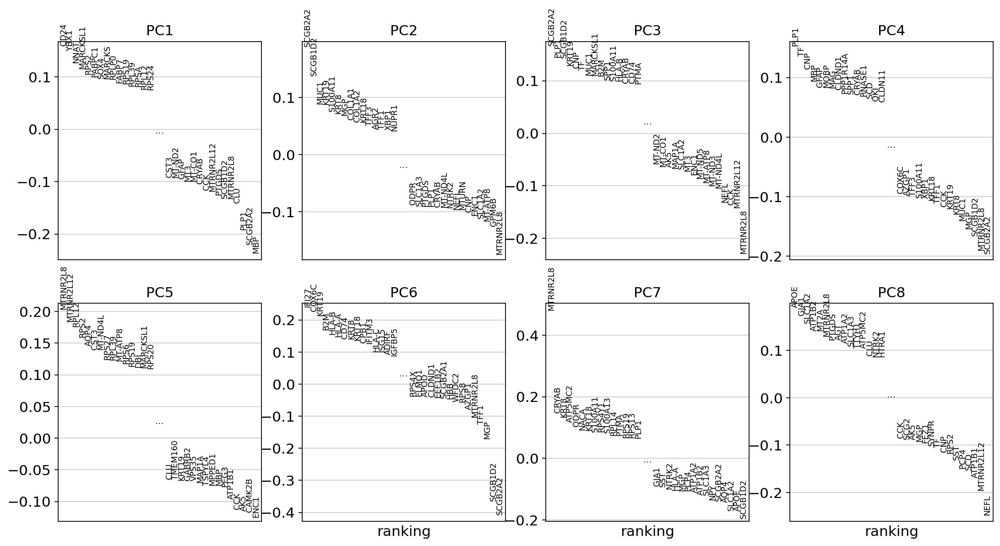

In [17]:
sc.pl.pca_loadings(de_adata, components=[1,2,3,4,5,6,7,8])

Уберем митохондриальные и рибосомные гены

In [18]:
mito = de_adata.var_names.str.startswith('MT-')
hb = de_adata.var_names.str.contains(("^HB[AB]"))
rb = de_adata.var_names.str.contains(("^RP[LS]"))
remove = mito | hb | rb
genes_to_remove = de_adata.var_names[remove].tolist()

keep = np.invert(remove)
print(sum(remove))

de_adata = de_adata[:,keep]

117


In [19]:
# remove genes from `highly_variable_genes`
highly_variable_genes = [gene for gene in highly_variable_genes if gene not in genes_to_remove]

## Rank genes

In [20]:
sc.tl.rank_genes_groups(de_adata, groupby='label', method='wilcoxon', pts=True)
adata.uns[key] = de_adata.uns["rank_genes_groups"]

ranking genes


/usr/local/lib/python3.9/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:18)


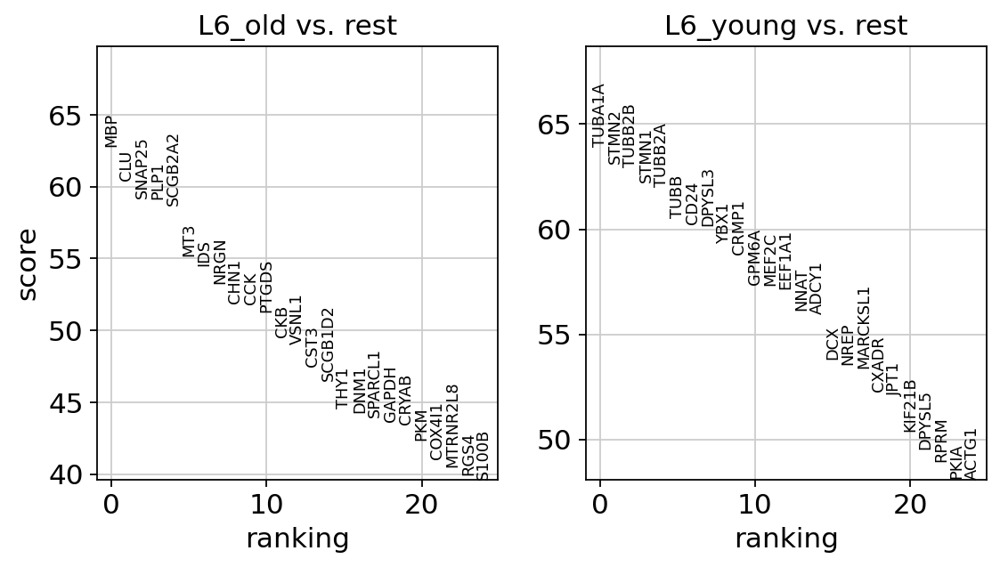

In [21]:
sc.pl.rank_genes_groups(de_adata, n_genes=25, sharey=False)

**TUBA1A** — Microtubules of the eukaryotic cytoskeleton perform essential and diverse functions and are composed of a heterodimer of alpha and beta tubulins

**STMN2** — This gene encodes a member of the stathmin family of phosphoproteins. Stathmin proteins function in microtubule dynamics and signal transduction. The encoded protein plays a regulatory role in neuronal growth and is also thought to be involved in osteogenesis. Reductions in the expression of this gene have been associated with Down's syndrome and Alzheimer's disease.

**CCK** — This gene encodes a member of the gastrin/cholecystokinin family of proteins. The encoded preproprotein is proteolytically processed to generate multiple protein products, including the peptide hormones cholecystokinin-8, -12, -33, and others. The encoded peptides have been shown to regulate gastric acid secretion and food intake. A sulfated form of cholecystokinin-8 may modulate neuronal activity in the brain.

**PLP1** — This gene encodes a transmembrane proteolipid protein that is the predominant component of myelin. The encoded protein may play a role in the compaction, stabilization, and maintenance of myelin sheaths, as well as in oligodendrocyte development and axonal survival. 

**CLU** — The protein encoded by this gene is a secreted chaperone that can under some stress conditions also be found in the cell cytosol. It has been suggested to be involved in several basic biological events such as cell death, tumor progression, and neurodegenerative disorders.

**MT3** — This gene is a member of the metallothionein family of genes. Proteins encoded by this gene family are low in molecular weight, are cysteine-rich, lack aromatic residues, and bind divalent heavy metal ions. This gene family member displays tissue-specific expression, and contains a threonine insert near its N-terminus and a glutamate-rich hexapeptide insert near its C-terminus relative to the proteins encoded by other gene family members.

## Посмотрим на дифф. экспрессированые гены

In [22]:
genes_rank_df = sc.get.rank_genes_groups_df(de_adata, group=groups[0])
genes_rank_df.index = genes_rank_df.names
genes_rank_df['abs_lfc'] = genes_rank_df['logfoldchanges'].abs()
genes_rank_df['abs_scores'] = genes_rank_df['scores'].abs()
genes_rank_df

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,abs_scores
names,,,,,,,,,
TUBA1A,TUBA1A,63.944321,3.387370,0.0,0.0,1.000000,0.903653,3.387370,63.944321
STMN2,STMN2,63.132591,3.041961,0.0,0.0,1.000000,0.822218,3.041961,63.132591
TUBB2B,TUBB2B,62.948734,4.871809,0.0,0.0,0.994347,0.384886,4.871809,62.948734
STMN1,STMN1,62.241547,1.998662,0.0,0.0,1.000000,0.929122,1.998662,62.241547
TUBB2A,TUBB2A,62.020535,2.103364,0.0,0.0,1.000000,0.910690,2.103364,62.020535
...,...,...,...,...,...,...,...,...,...
SCGB2A2,SCGB2A2,-58.692135,-33.902988,0.0,0.0,0.000000,0.917393,33.902988,58.692135
PLP1,PLP1,-59.096416,-6.236521,0.0,0.0,0.131148,0.938170,6.236521,59.096416
SNAP25,SNAP25,-59.192028,-2.989235,0.0,0.0,0.820237,0.972185,2.989235,59.192028


### Распределение p-value

<Axes: >

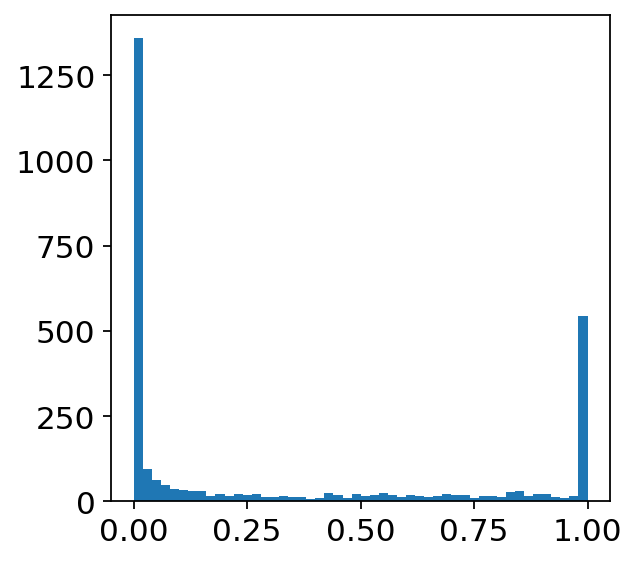

In [23]:
genes_rank_df.loc[highly_variable_genes, 'pvals_adj'].hist(bins=50, grid=False)

Не понимаю на сколько нормально видеть такую картину

### Сравним молодые/старые

In [24]:
top_genes_df = genes_rank_df.loc[highly_variable_genes][(genes_rank_df.pvals_adj < 0.05) &
                                                        (genes_rank_df.pct_nz_group > 0.1) &
                                                        (genes_rank_df.pct_nz_reference > 0.1)].sort_values(by='abs_lfc', ascending=False)
top_genes_df.head()

<ipython-input-24-96267cd2d6a5>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  top_genes_df = genes_rank_df.loc[highly_variable_genes][(genes_rank_df.pvals_adj < 0.05) &


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,abs_scores
names,,,,,,,,,
MBP,MBP,-62.803616,-7.219372,0.000000e+00,0.000000e+00,0.137931,0.984249,7.219372,62.803616
PLP1,PLP1,-59.096416,-6.236521,0.000000e+00,0.000000e+00,0.131148,0.938170,6.236521,59.096416
CD24,CD24,60.255547,5.246889,0.000000e+00,0.000000e+00,0.970040,0.156669,5.246889,60.255547
YBX1,YBX1,59.318642,4.757682,0.000000e+00,0.000000e+00,0.968344,0.199062,4.757682,59.318642
KRT19,KRT19,-35.793949,-4.266266,1.371727e-280,2.619456e-278,0.111362,0.614946,4.266266,35.793949


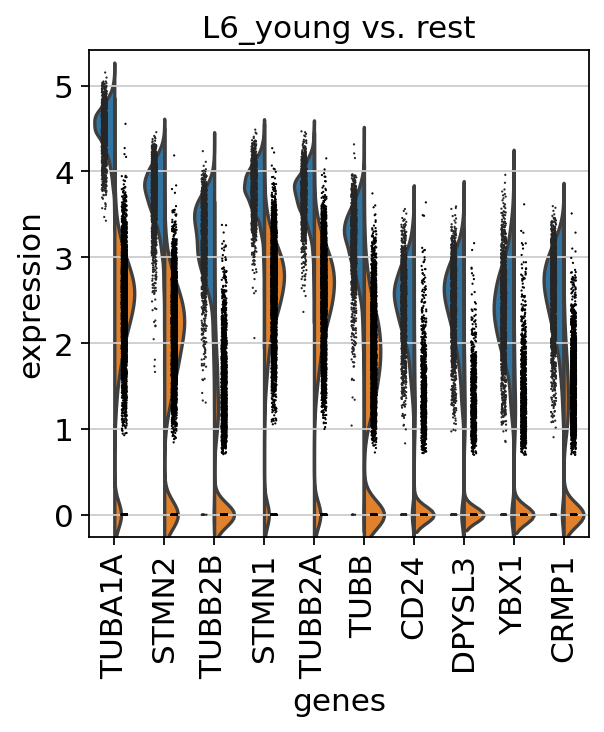

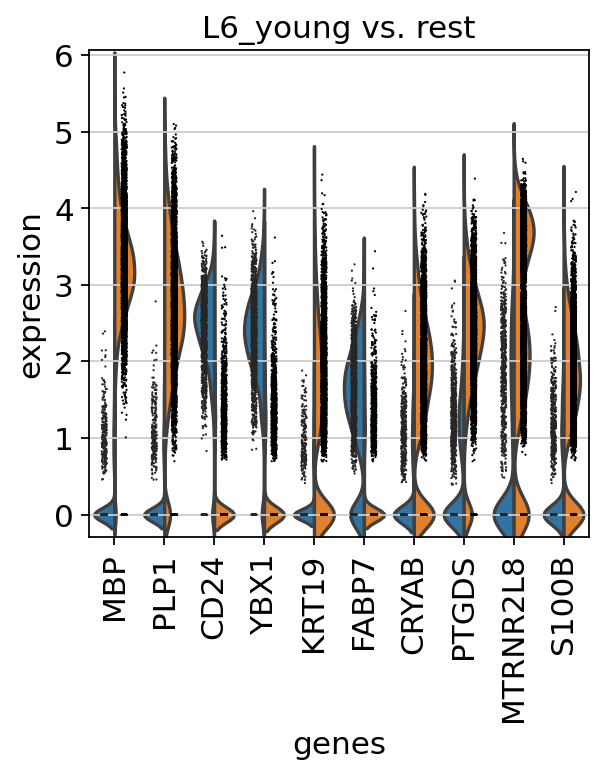

In [25]:
genes1 = genes_rank_df.index[:10].tolist()
genes2 = top_genes_df.index[:10].tolist()
sc.pl.rank_genes_groups_violin(de_adata, gene_names=genes1, groups=groups[0])
sc.pl.rank_genes_groups_violin(de_adata, gene_names=genes2, groups=groups[0])

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


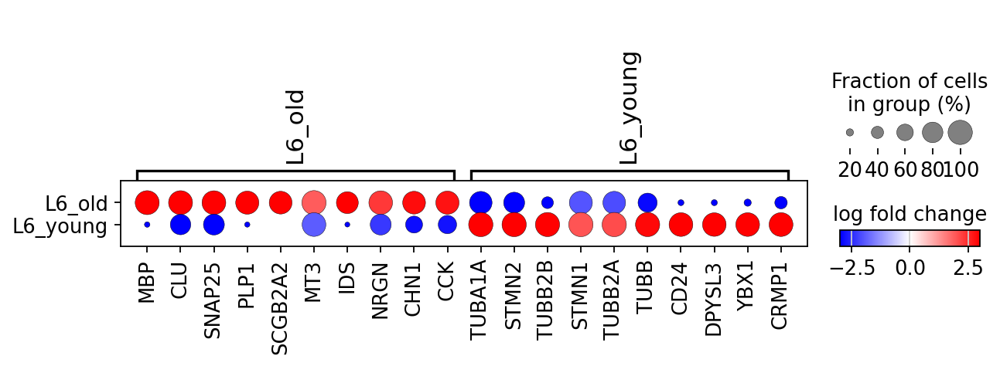

In [26]:
sc.pl.rank_genes_groups_dotplot(de_adata, groupby="label", n_genes=10, values_to_plot='logfoldchanges',
                                min_logfoldchange=1, vmax=3, vmin=-3, cmap='bwr')

### Посмотрим на отдельные образцы

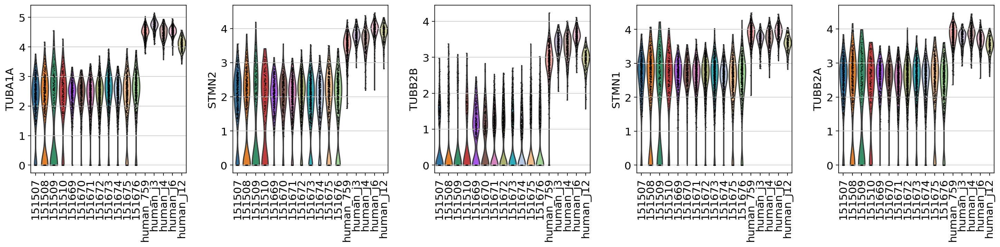

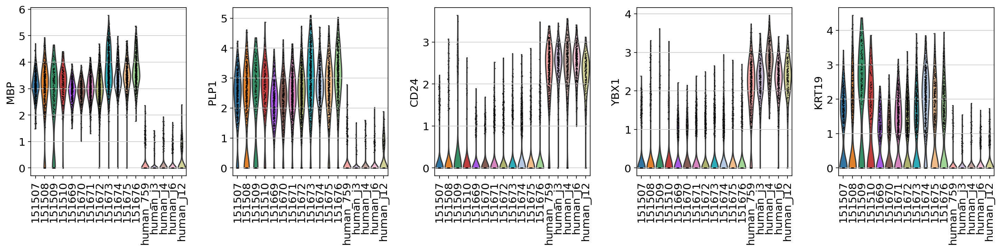

In [27]:
sc.pl.violin(de_adata, genes1[:5], groupby='sample_id', rotation=90)
sc.pl.violin(de_adata, genes2[:5], groupby='sample_id', rotation=90)

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


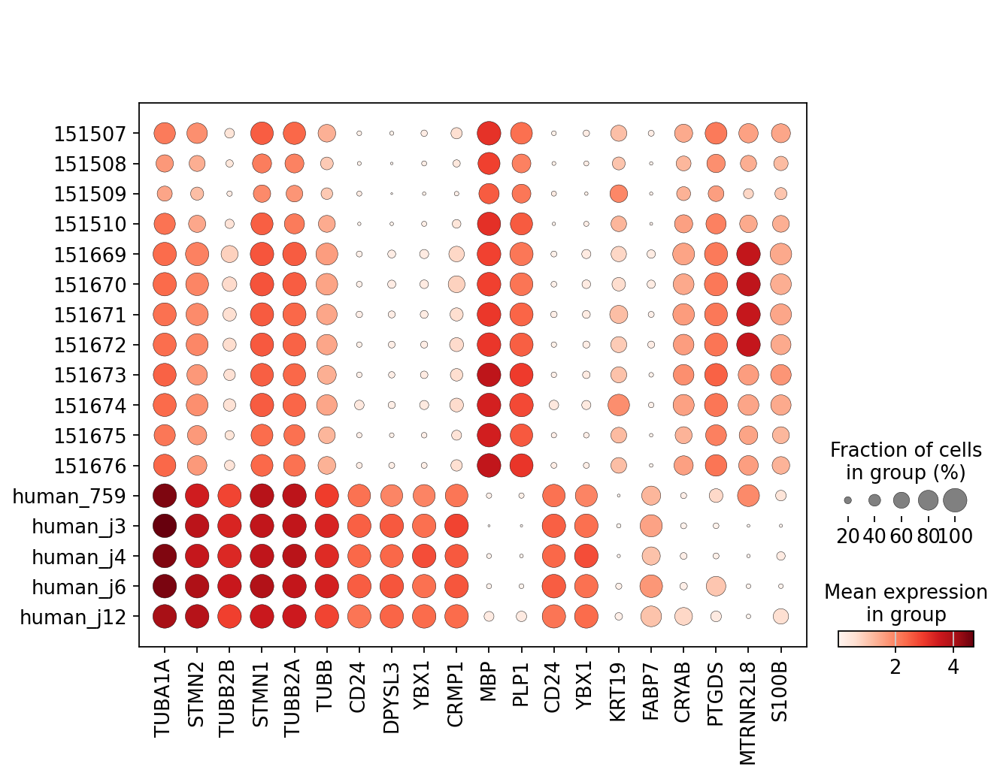

In [28]:
sc.pl.dotplot(de_adata, genes1 + genes2, groupby='sample_id')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample_id']`
categories: 151507, 151508, 151509, etc.
var_group_labels: L6_old, L6_young


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


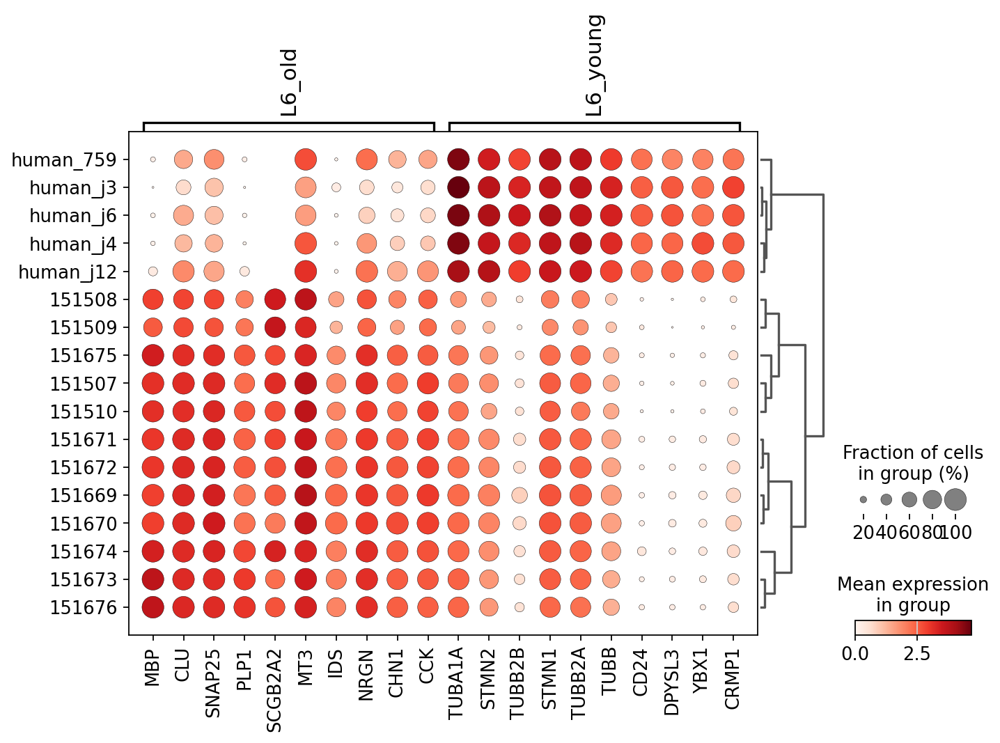

In [29]:
sc.pl.rank_genes_groups_dotplot(de_adata, groupby="sample_id", n_genes=10)

### Сохраним csv файл

In [30]:
genes_rank_df = sc.get.rank_genes_groups_df(de_adata, group=groups[0])
genes_rank_df.to_csv(dir_path + 'DE/young_vs_old_scanpy/' + key + '.csv')

## Gene Set Analysis

In [31]:
gene_set_names = gseapy.get_library_name(organism='Human')
gene_set_names[:5]
#gene_set_names

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues']

Выберем только дифференциально экспрессированые гены

In [32]:
gene_set = sc.get.rank_genes_groups_df(de_adata, group=groups[0], log2fc_min=1, pval_cutoff=0.01).set_index('names').loc[de_adata.var["highly_variable"]]
gene_set = gene_set[(gene_set.pct_nz_group > 0.1) & (gene_set.pct_nz_reference > 0.1)]
gene_list = gene_set.index.str.strip().tolist()
print(len(gene_list))

129


Возьмём базу данных `GO_Biological_Process_2021`

In [33]:
enr_res = gseapy.enrichr(gene_list=gene_list,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2021',
                     cutoff = 0.5)

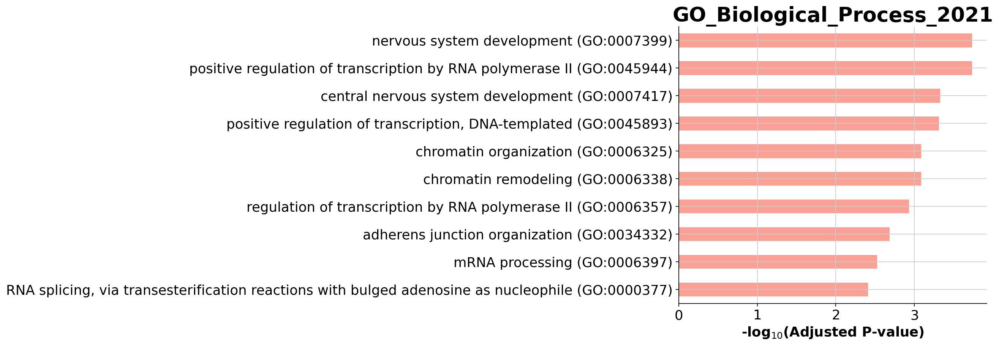

In [34]:
gseapy.barplot(enr_res.res2d, title='GO_Biological_Process_2021')

## GSEA

### Scores

In [35]:
scores = (
    sc.get.rank_genes_groups_df(de_adata, group=groups[0])
    .set_index('names')
    .loc[de_adata.var["highly_variable"]]
    .sort_values("scores", ascending=False)
    [['scores']]
    .rename_axis(["young_L1"], axis=1)
    )
scores

young_L1,scores
names,
CD24,60.255547
YBX1,59.318642
NNAT,56.123878
MARCKSL1,53.395355
MARCKS,47.001175
...,...
MT3,-55.187485
SCGB2A2,-58.692135
PLP1,-59.096416


In [36]:
res = gseapy.prerank(rnk=scores, gene_sets='KEGG_2021_Human')

In [37]:
res.res2d.head()

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
Mineral absorption,-0.835066,-1.942686,0.000000,0.006057,60,17,ATP2B4;SLC40A1;SLC26A6;S100G;MT1F;ATP2B3;CYBRD...,CYBRD1;ATP1B2;FTL;MT1E;MT1M;MT1X;ATP1A2;MT2A;A...
Viral myocarditis,-0.817340,-1.950326,0.000000,0.008077,60,18,LAMA2;SGCD;ICAM1;ITGB2;HLA-DMB;HLA-DMA;HLA-F;H...,HLA-DMA;HLA-F;HLA-DQB1;HLA-DRB5;HLA-DPB1;HLA-D...
Staphylococcus aureus infection,-0.763370,-1.993367,0.000000,0.009692,95,29,C1QB;FCGR1A;C1QA;C1QC;CFH;FCGR3A;C1S;PTAFR;FCG...,HLA-DQB1;CFD;HLA-DRB5;HLA-DPB1;HLA-DPA1;HLA-DR...
Autoimmune thyroid disease,-0.838268,-1.951722,0.000000,0.011307,53,15,FAS;HLA-DMB;HLA-DMA;HLA-F;CGA;HLA-DQB1;HLA-DRB...,HLA-DMA;HLA-F;CGA;HLA-DQB1;HLA-DRB5;HLA-DPB1;H...
Natural killer cell mediated cytotoxicity,-0.770251,-1.871009,0.003257,0.016799,131,18,IFNGR1;FCGR3A;FAS;SYK;FCER1G;ICAM2;ICAM1;ITGB2...,TYROBP;PRKCA;HLA-E;TNFSF10;HLA-A;HLA-C;HLA-B


In [38]:
terms = res.res2d.index
terms[:20]

Index(['Mineral absorption', 'Viral myocarditis',
       'Staphylococcus aureus infection', 'Autoimmune thyroid disease',
       'Natural killer cell mediated cytotoxicity', 'Salivary secretion',
       'Antigen processing and presentation', 'Epstein-Barr virus infection',
       'Type I diabetes mellitus', 'Complement and coagulation cascades',
       'Pancreatic secretion', 'Necroptosis', 'Amyotrophic lateral sclerosis',
       'Human immunodeficiency virus 1 infection', 'MicroRNAs in cancer',
       'Phagosome', 'Bile secretion',
       'Intestinal immune network for IgA production', 'Insulin secretion',
       'Estrogen signaling pathway'],
      dtype='object', name='Term')

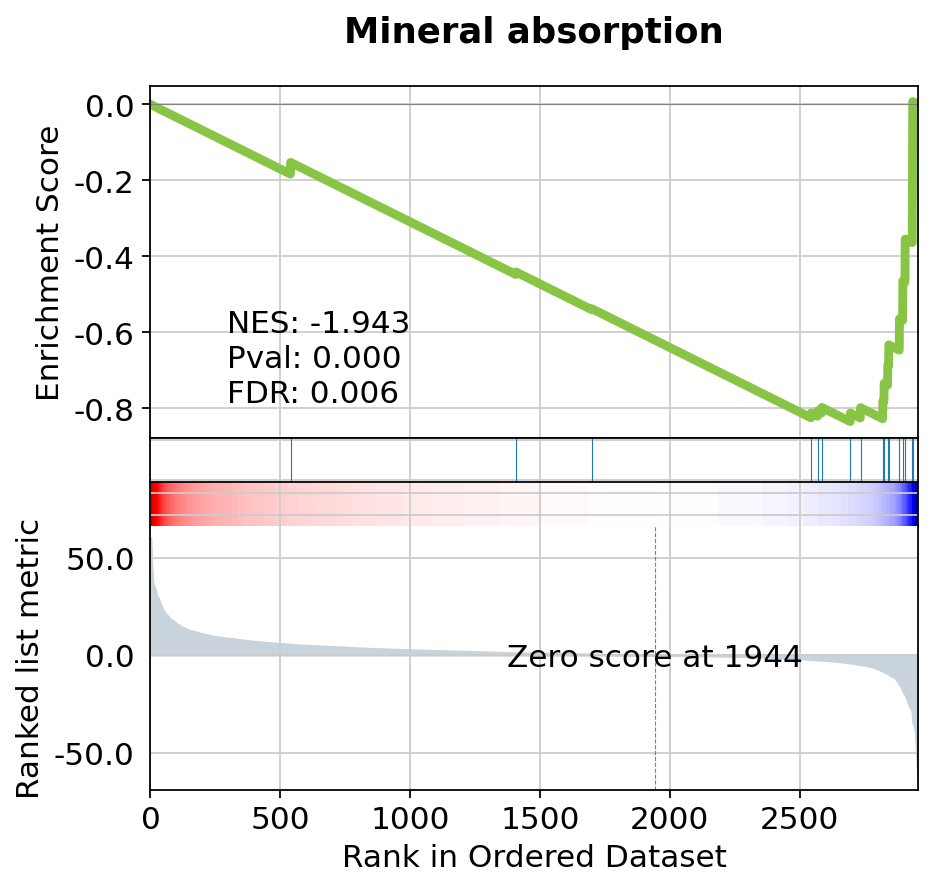

In [40]:
gseapy.gseaplot(rank_metric=res.ranking, term=terms[0], **res.results[terms[0]])